# Graded Challenge 7 Phase 2 - Computer Vision
- Name: Gilbert Kurniawan H
- Batch: RMT 026
- Dateset: The dataset used [linked here](https://www.kaggle.com/datasets/vencerlanz09/plastic-paper-garbage-bag-synthetic-images/data) contains 15000 images of bag separated by class while the ImageClassesCombined folder contains annotated images of all classes combined.
- Objective: To create a classification model using Artificial Neural Network to predict whether an image can be classified as Paper, Plastic, or Garbage Bag.


# 2. Import Libraries
> *Cell* pertama pada *notebook* **harus berisi dan hanya berisi** semua *library* yang digunakan dalam *project*.

In [1]:
import os
import cv2
import glob #gunakan modul glob
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os.path
import shutil
import pickle
from PIL import Image  # Import the Image module from PIL
from pathlib import Path
from collections import Counter
from google.colab import drive # google colab only

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Set the display option to None (no limit)
pd.set_option('display.max_colwidth', None)

# 3. Data Loading
> Bagian ini berisi proses penyiapan data sebelum dilakukan eksplorasi data lebih lanjut. Proses Data Loading dapat berupa memberi nama baru untuk setiap kolom, mengecek ukuran dataset, dll.



In [3]:
!mkdir ~/.kaggle

!cp 'kaggle.json' ~/.kaggle
!ls ~/.kaggle

kaggle.json


In [4]:
!kaggle datasets download -d vencerlanz09/plastic-paper-garbage-bag-synthetic-images

 98% 441M/451M [00:03<00:00, 143MB/s]
100% 451M/451M [00:03<00:00, 142MB/s]


In [5]:
!unzip -q /content/plastic-paper-garbage-bag-synthetic-images.zip -d images

In [6]:
main_path= '/content/images/Bag Classes/Bag Classes'
os.listdir(main_path) #mengecek isi dir di dalam folder main_path

['Plastic Bag Images', 'Paper Bag Images', 'Garbage Bag Images']

In [7]:
garbage_dir = os.path.join(main_path, 'Garbage Bag Image')
paper_dir = os.path.join(main_path, 'Paper Bag Image')
plastic_dir = os.path.join(main_path, 'Plastic Bag Image')
print(garbage_dir)

/content/images/Bag Classes/Bag Classes/Garbage Bag Image


In [8]:
image_dir = Path(main_path)

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.png')) + list(image_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))
filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

In [9]:
image_df

,Filepath,Label
0,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00002103.jpg,Plastic Bag Images
1,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00004216.jpg,Plastic Bag Images
2,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00002349.jpg,Plastic Bag Images
3,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00001607.jpg,Plastic Bag Images
4,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00001186.jpg,Plastic Bag Images
...,...,...
14995,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00004272.jpg,Garbage Bag Images
14996,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00002906.jpg,Garbage Bag Images
14997,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00001543.jpg,Garbage Bag Images
14998,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00004525.jpg,Garbage Bag Images


In [10]:
# save image to csv
image_df.to_csv('image_df.csv', index=False)

In [11]:
image_df_paper = image_df[image_df['Label'] == 'Paper Bag Images']

In [12]:
image_df_paper

,Filepath,Label
5000,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00002103.jpg,Paper Bag Images
5001,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00004216.jpg,Paper Bag Images
5002,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00002349.jpg,Paper Bag Images
5003,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00001607.jpg,Paper Bag Images
5004,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00001186.jpg,Paper Bag Images
...,...,...
9995,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00004272.jpg,Paper Bag Images
9996,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00002906.jpg,Paper Bag Images
9997,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00001543.jpg,Paper Bag Images
9998,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00004525.jpg,Paper Bag Images


In [13]:
image_df_garbage = image_df[image_df['Label'] == 'Garbage Bag Images']

In [14]:
image_df_garbage

,Filepath,Label
10000,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00002103.jpg,Garbage Bag Images
10001,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00004216.jpg,Garbage Bag Images
10002,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00002349.jpg,Garbage Bag Images
10003,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00001607.jpg,Garbage Bag Images
10004,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00001186.jpg,Garbage Bag Images
...,...,...
14995,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00004272.jpg,Garbage Bag Images
14996,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00002906.jpg,Garbage Bag Images
14997,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00001543.jpg,Garbage Bag Images
14998,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00004525.jpg,Garbage Bag Images


In [15]:
image_df_plastic = image_df[image_df['Label'] == 'Plastic Bag Images']

In [16]:
image_df_plastic

,Filepath,Label
0,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00002103.jpg,Plastic Bag Images
1,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00004216.jpg,Plastic Bag Images
2,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00002349.jpg,Plastic Bag Images
3,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00001607.jpg,Plastic Bag Images
4,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00001186.jpg,Plastic Bag Images
...,...,...
4995,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00004272.jpg,Plastic Bag Images
4996,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00002906.jpg,Plastic Bag Images
4997,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00001543.jpg,Plastic Bag Images
4998,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00004525.jpg,Plastic Bag Images


# 4. Exploratory Data Analysis (EDA)
> Bagian ini berisi explorasi data pada dataset diatas dengan menggunakan query, grouping, visualisasi sederhana, dan lain sebagainya.

- Before continuing to Feature Engineering steps, we will be checking our images that we will use.
- Some of the important aspect to be checked:
  - Image Dimension (Width x Height)
  - Image Colorspace
  - Image Data Count (Balanced or not)
  - Image Characteristics (Shape, Color, Position, etc)

## Check images sizes

In [17]:
# check image shape
img = plt.imread('/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00000172.jpg')
print(img.shape)

(300, 300, 3)


- From the image shape above, we can see the colorspace of the images are RGB since the number of channels is 3 and the image size are 300x300 pixels. We will further check for the colorspace of the images and the image size distribution in the next section.

In [18]:
# Function to get image size
def get_image_size(filepath):
    try:
        with Image.open(filepath) as img:
            return img.size
    except Exception as e:
        print(f"Error processing image {filepath}: {str(e)}")
        return None

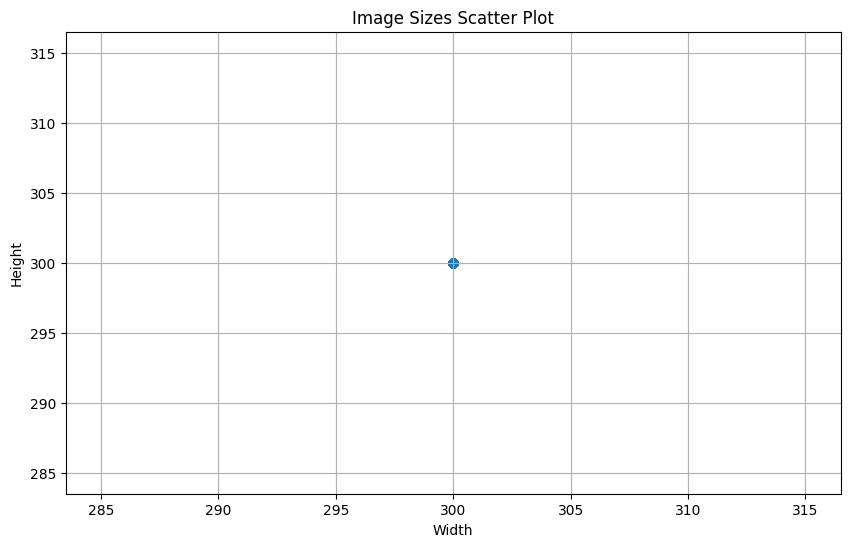

In [19]:
# Apply the function to get image sizes
image_df['ImageSize'] = image_df['Filepath'].apply(get_image_size)

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(image_df['ImageSize'].apply(lambda x: x[0] if x else None),  # Width
            image_df['ImageSize'].apply(lambda x: x[1] if x else None),  # Height
            alpha=0.5)
plt.title('Image Sizes Scatter Plot')
plt.xlabel('Width')
plt.ylabel('Height')
plt.grid(True)
plt.show()

- From the scatter plot above, we can see that all the images have the same size of 300x300 pixels. This is good because we don't have to resize the images before feeding them to the model. If the images have different sizes, we have to resize them to the same size before feeding them to the model.

## Check class balance

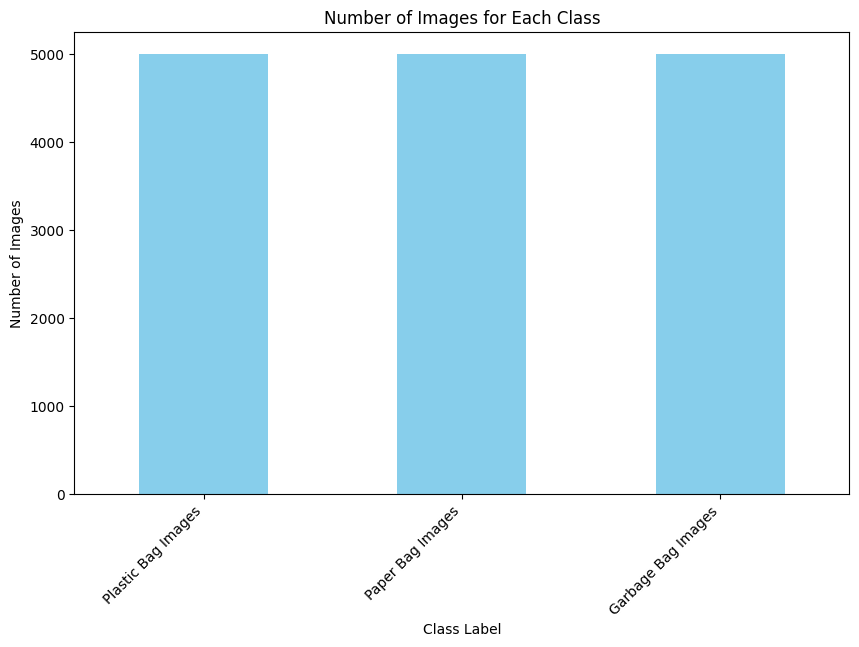

In [20]:
# Count the number of images for each class
class_counts = image_df['Label'].value_counts()

# Create a bar plot
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Images for Each Class')
plt.xlabel('Class Label')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.show()

- After checking the image sizes, we can check the class balance. We can see that the classes are balanced. This is good because we don't have to do any class balancing. In case of imbalanced classes, we can use data augmentation to balance the classes.

## Check Image Characteristic (Color, Rotation, Angle, etc)

In [21]:
def visualize_random_images(df, num_images_per_class=5, random_seed=44):
    # Select images for each class
    random_paper = df[df['Label'] == 'Paper Bag Images']
    random_plastic = df[df['Label'] == 'Plastic Bag Images']
    random_garbage = df[df['Label'] == 'Garbage Bag Images']

    # Sample 5 random images from each class if available
    random_paper = random_paper.sample(min(num_images_per_class, len(random_paper)), random_state=random_seed)
    random_plastic = random_plastic.sample(min(num_images_per_class, len(random_plastic)), random_state=random_seed)
    random_garbage = random_garbage.sample(min(num_images_per_class, len(random_garbage)), random_state=random_seed)

    # Concatenate the randomly selected images
    random_images = pd.concat([random_paper, random_plastic, random_garbage])

    # Shuffle the order of the rows
    random_images = random_images.sample(frac=1, random_state=random_seed).reset_index(drop=True)

    # Display the randomly selected images in separate rows for each category
    num_rows = 3
    num_cols = num_images_per_class

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

    for i, category in enumerate(['Paper Bag Images', 'Plastic Bag Images', 'Garbage Bag Images']):
        category_images = random_images[random_images['Label'] == category]

        for j, (_, row) in enumerate(category_images.iterrows()):
            image_path = row['Filepath']
            image = plt.imread(image_path)
            axes[i, j].imshow(image)  # You can remove cmap if images are RGB
            axes[i, j].set_title(category)
            axes[i, j].axis('off')

    plt.show()

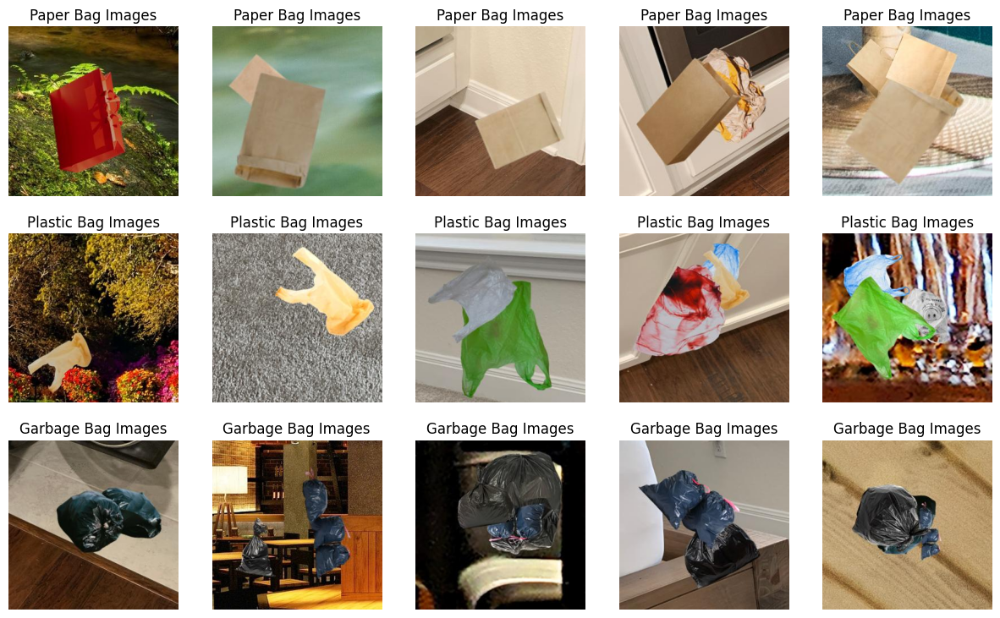

In [22]:
visualize_random_images(image_df)

From the random image above for each class, we can see some of the characteristics of the images for each class:
- Paper: The images are mostly brown colored and shaped rectangular. The position of the images are very random. Some of the images are rotated and some are not. Some of the images are also flipped horizontally and vertically. In this case we can use data augmentation to flip the images horizontally and vertically so that the model can learn the images better.
- Plastic: The images are mostly very colorful (blue, green, white, etc) and shaped also rectangular but have little handle to grab. The position of the images are very random. Some of the images are rotated and some are not. Some of the images are also flipped horizontally and vertically. Similar to the paper images, we can use data augmentation to flip the images horizontally and vertically so that the model can learn the images better.
- Garbage Bag: The images are mostly black colored and shaped rounder compared to the other classes. The position of the images are very random. Some of the images are rotated and some are not. Some of the images are also flipped horizontally and vertically. Again, we can use data augmentation to flip the images horizontally and vertically so that the model can learn the images better.

## Validation for the Images Colorspace

In [23]:
def visualize_random_images_single_channel(df, channel='red', num_images_per_class=5, random_seed=44):
    # Select images for each class
    random_paper = df[df['Label'] == 'Paper Bag Images']
    random_plastic = df[df['Label'] == 'Plastic Bag Images']
    random_garbage = df[df['Label'] == 'Garbage Bag Images']

    # Sample 5 random images from each class if available
    random_paper = random_paper.sample(min(num_images_per_class, len(random_paper)), random_state=random_seed)
    random_plastic = random_plastic.sample(min(num_images_per_class, len(random_plastic)), random_state=random_seed)
    random_garbage = random_garbage.sample(min(num_images_per_class, len(random_garbage)), random_state=random_seed)

    # Concatenate the randomly selected images
    random_images = pd.concat([random_paper, random_plastic, random_garbage])

    # Shuffle the order of the rows
    random_images = random_images.sample(frac=1, random_state=random_seed).reset_index(drop=True)

    # Display the randomly selected images with the specified color channel
    num_rows = 3
    num_cols = num_images_per_class

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 3 * num_rows))

    for i, category in enumerate(['Paper Bag Images', 'Plastic Bag Images', 'Garbage Bag Images']):
        category_images = random_images[random_images['Label'] == category]

        for j, (_, row) in enumerate(category_images.iterrows()):
            image_path = row['Filepath']
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

            # Extract the specified channel
            if channel == 'red':
                single_channel_image = image[:, :, 0]
                cmap = 'Reds'
            elif channel == 'green':
                single_channel_image = image[:, :, 1]
                cmap = 'Greens'
            elif channel == 'blue':
                single_channel_image = image[:, :, 2]
                cmap = 'Blues'
            else:
                raise ValueError("Invalid channel. Use 'red', 'green', or 'blue'.")

            axes[i, j].imshow(single_channel_image, cmap=cmap)  # Use cmap based on the channel
            axes[i, j].set_title(f'{category} - {channel.capitalize()} Channel')
            axes[i, j].axis('off')

    plt.show()


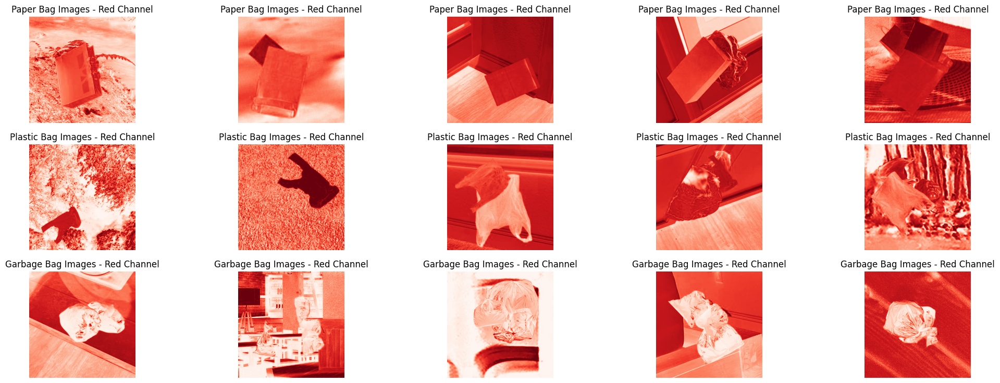

In [24]:
visualize_random_images_single_channel(image_df, channel='red')

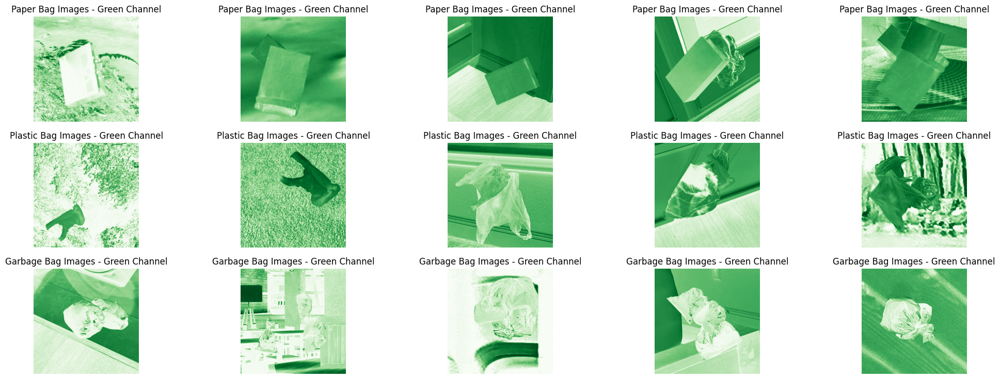

In [25]:
visualize_random_images_single_channel(image_df, channel='green')

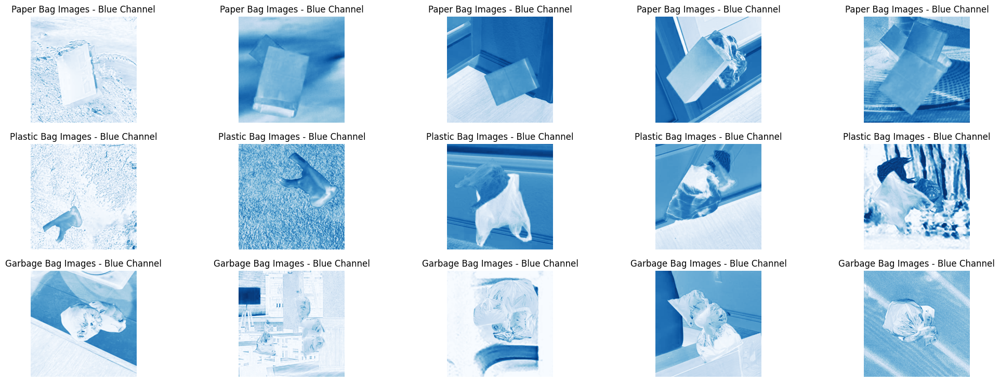

In [26]:
visualize_random_images_single_channel(image_df, channel='blue')

- Since the images managed to show the color correctly according to the specified channel, we can conclude that the images colorspace is indeed RGB colospace images

# 5. Feature Engineering
> Bagian ini berisi proses penyiapan data untuk proses pelatihan model, seperti pembagian data menjadi train-val-test, preprocessing, dan proses-proses lain yang dibutuhkan.   

In [27]:
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

In [28]:
train_df

,Filepath,Label,ImageSize
9839,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00002079.jpg,Paper Bag Images,"(300, 300)"
9680,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00003073.jpg,Paper Bag Images,"(300, 300)"
7093,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00002067.jpg,Paper Bag Images,"(300, 300)"
11293,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00003871.jpg,Garbage Bag Images,"(300, 300)"
820,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00004024.jpg,Plastic Bag Images,"(300, 300)"
...,...,...,...
5191,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00004147.jpg,Paper Bag Images,"(300, 300)"
13418,/content/images/Bag Classes/Bag Classes/Garbage Bag Images/00001602.jpg,Garbage Bag Images,"(300, 300)"
5390,/content/images/Bag Classes/Bag Classes/Paper Bag Images/00002193.jpg,Paper Bag Images,"(300, 300)"
860,/content/images/Bag Classes/Bag Classes/Plastic Bag Images/00004133.jpg,Plastic Bag Images,"(300, 300)"


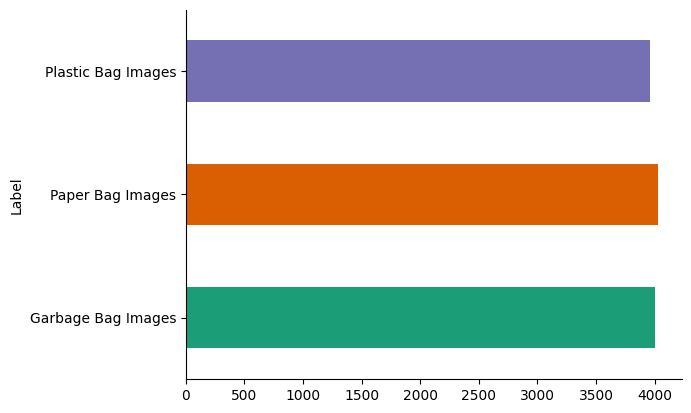

In [29]:
from matplotlib import pyplot as plt
import seaborn as sns
train_df.groupby('Label').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

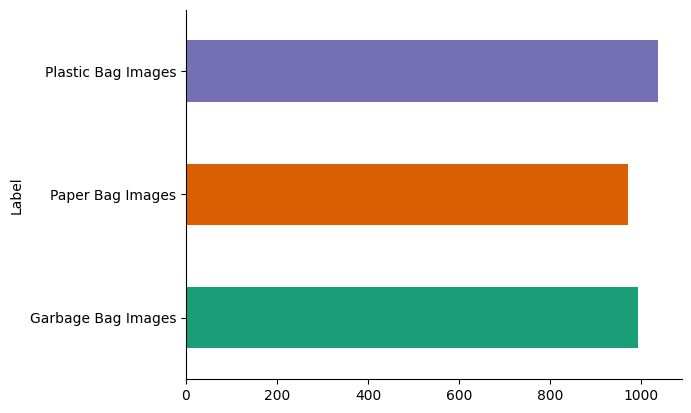

In [30]:
from matplotlib import pyplot as plt
import seaborn as sns
test_df.groupby('Label').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [31]:
img_height= 300
img_width= 300
batch_size= 32
inputs= (img_height, img_width,3)

In [32]:
# Backup

base_dir = '/content/images/Bag Classes/Bag Classes/'
classes = ['Plastic Bag Images', 'Garbage Bag Images', 'Paper Bag Images']

# images split for each directory into train, validation, and test sets
for class_name in classes:
    # Get file names
    dir_path = os.path.join(base_dir, class_name)
    file_names = os.listdir(dir_path)

    # Shuffle the file names
    np.random.shuffle(file_names)

    # Split the file names into train, validation, and test (train 70%, val 70-90% (20%), test 10%)
    train_files, val_files, test_files = np.split(np.array(file_names),
                                                  [int(len(file_names)*0.7), int(len(file_names)*0.9)])

    # Create directories for train, validation, and test, if they don't exist
    train_dir = os.path.join(base_dir, 'train', class_name)
    val_dir = os.path.join(base_dir, 'val', class_name)
    test_dir = os.path.join(base_dir, 'test', class_name)
    for dir in [train_dir, val_dir, test_dir]:
        os.makedirs(dir, exist_ok=True)

    # Move the files to the new directories
    for name in train_files:
        shutil.move(os.path.join(dir_path, name), train_dir)
    for name in val_files:
        shutil.move(os.path.join(dir_path, name), val_dir)
    for name in test_files:
        shutil.move(os.path.join(dir_path, name), test_dir)


In [33]:
# Dataframe to store train,test,val
train_dfs = []
val_dfs = []
test_dfs = []

for class_name in classes:
    # Create a list of dictionaries containing file paths and class labels
    train_data = []
    val_data = []
    test_data = []

    # Loop through each set
    for set_name, data_list in [('train', train_data), ('val', val_data), ('test', test_data)]:
        set_dir = os.path.join(base_dir, set_name, class_name)
        for filename in os.listdir(set_dir):
            file_path = os.path.join(set_dir, filename)
            data_list.append({'path': file_path, 'class': class_name})

    train_df = pd.DataFrame(train_data)
    val_df = pd.DataFrame(val_data)
    test_df = pd.DataFrame(test_data)

    train_dfs.append(train_df)
    val_dfs.append(val_df)
    test_dfs.append(test_df)

# Concatenate the DataFrames for each set
all_train_df = pd.concat(train_dfs, ignore_index=True)
all_val_df = pd.concat(val_dfs, ignore_index=True)
all_test_df = pd.concat(test_dfs, ignore_index=True)

# Save to CSV files
all_train_df.to_csv('/content/images/all_train_class_mapping.csv', index=False)
all_val_df.to_csv('/content/images/all_val_class_mapping.csv', index=False)
all_test_df.to_csv('/content/images/all_test_class_mapping.csv', index=False)


In [34]:
# Create a data generator for each set
datagen = ImageDataGenerator()

# Load images from the directories
train_generator = datagen.flow_from_directory(os.path.join(base_dir, 'train'), target_size=(img_height, img_width), batch_size=32, class_mode='categorical')
val_generator = datagen.flow_from_directory(os.path.join(base_dir, 'val'), target_size=(img_height, img_width), batch_size=32, class_mode='categorical')
test_generator = datagen.flow_from_directory(os.path.join(base_dir, 'test'), target_size=(img_height, img_width), batch_size=32, class_mode='categorical')

Found 10500 images belonging to 3 classes.
Found 3000 images belonging to 3 classes.
Found 1500 images belonging to 3 classes.


In [35]:
# Create a data generator for each set using flow_from_dataframe
train_generator = datagen.flow_from_dataframe(
    dataframe=all_train_df,
    x_col='path',
    y_col='class',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=123,
)

val_generator = datagen.flow_from_dataframe(
    dataframe=all_val_df,
    x_col='path',
    y_col='class',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False,  # Set shuffle to False for the validation set
    seed=123
)

test_generator = datagen.flow_from_dataframe(
    dataframe=all_test_df,
    x_col='path',
    y_col='class',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False,  # Set shuffle to False for the test set
    seed=123
)

Found 10500 validated image filenames belonging to 3 classes.
Found 3000 validated image filenames belonging to 3 classes.
Found 1500 validated image filenames belonging to 3 classes.


In [36]:
all_train_df

,path,class
0,/content/images/Bag Classes/Bag Classes/train/Plastic Bag Images/00002103.jpg,Plastic Bag Images
1,/content/images/Bag Classes/Bag Classes/train/Plastic Bag Images/00002349.jpg,Plastic Bag Images
2,/content/images/Bag Classes/Bag Classes/train/Plastic Bag Images/00001607.jpg,Plastic Bag Images
3,/content/images/Bag Classes/Bag Classes/train/Plastic Bag Images/00002374.jpg,Plastic Bag Images
4,/content/images/Bag Classes/Bag Classes/train/Plastic Bag Images/00003851.jpg,Plastic Bag Images
...,...,...
10495,/content/images/Bag Classes/Bag Classes/train/Paper Bag Images/00004502.jpg,Paper Bag Images
10496,/content/images/Bag Classes/Bag Classes/train/Paper Bag Images/00001215.jpg,Paper Bag Images
10497,/content/images/Bag Classes/Bag Classes/train/Paper Bag Images/00004272.jpg,Paper Bag Images
10498,/content/images/Bag Classes/Bag Classes/train/Paper Bag Images/00001543.jpg,Paper Bag Images


In [37]:
all_val_df

,path,class
0,/content/images/Bag Classes/Bag Classes/val/Plastic Bag Images/00001186.jpg,Plastic Bag Images
1,/content/images/Bag Classes/Bag Classes/val/Plastic Bag Images/00002564.jpg,Plastic Bag Images
2,/content/images/Bag Classes/Bag Classes/val/Plastic Bag Images/00001413.jpg,Plastic Bag Images
3,/content/images/Bag Classes/Bag Classes/val/Plastic Bag Images/00003363.jpg,Plastic Bag Images
4,/content/images/Bag Classes/Bag Classes/val/Plastic Bag Images/00004117.jpg,Plastic Bag Images
...,...,...
2995,/content/images/Bag Classes/Bag Classes/val/Paper Bag Images/00003033.jpg,Paper Bag Images
2996,/content/images/Bag Classes/Bag Classes/val/Paper Bag Images/00003220.jpg,Paper Bag Images
2997,/content/images/Bag Classes/Bag Classes/val/Paper Bag Images/00001813.jpg,Paper Bag Images
2998,/content/images/Bag Classes/Bag Classes/val/Paper Bag Images/00002906.jpg,Paper Bag Images


In [38]:
all_test_df

,path,class
0,/content/images/Bag Classes/Bag Classes/test/Plastic Bag Images/00004216.jpg,Plastic Bag Images
1,/content/images/Bag Classes/Bag Classes/test/Plastic Bag Images/00003117.jpg,Plastic Bag Images
2,/content/images/Bag Classes/Bag Classes/test/Plastic Bag Images/00004475.jpg,Plastic Bag Images
3,/content/images/Bag Classes/Bag Classes/test/Plastic Bag Images/00000705.jpg,Plastic Bag Images
4,/content/images/Bag Classes/Bag Classes/test/Plastic Bag Images/00002180.jpg,Plastic Bag Images
...,...,...
1495,/content/images/Bag Classes/Bag Classes/test/Paper Bag Images/00001931.jpg,Paper Bag Images
1496,/content/images/Bag Classes/Bag Classes/test/Paper Bag Images/00004157.jpg,Paper Bag Images
1497,/content/images/Bag Classes/Bag Classes/test/Paper Bag Images/00001746.jpg,Paper Bag Images
1498,/content/images/Bag Classes/Bag Classes/test/Paper Bag Images/00001476.jpg,Paper Bag Images


In [39]:
# SANITY CHECK (to check if theres file that slipped to the other set)

base_dir = '/content/images/Bag Classes/Bag Classes/'
class_dirs = ['Plastic Bag Images', 'Paper Bag Images', 'Garbage Bag Images']

# Create a list to store full paths for each class in each dataframe
class_files = {class_name: {df_name: [] for df_name in ['all_train_df', 'all_val_df', 'all_test_df']} for class_name in class_dirs}

# Populate the list with full paths for each class in each dataframe
for class_name in class_dirs:
    for df_name, df in zip(['all_train_df', 'all_val_df', 'all_test_df'], [all_train_df, all_val_df, all_test_df]):
        class_dir = os.path.join(base_dir, class_name)
        class_files[class_name][df_name] = set([os.path.join(class_dir, file) for file in df[df['class'] == class_name]['path']])

# Check for intersections between dataframes
for df_name_1 in ['all_train_df', 'all_val_df', 'all_test_df']:
    for df_name_2 in ['all_train_df', 'all_val_df', 'all_test_df']:
        if df_name_1 != df_name_2:
            common_files = set()
            for class_name in class_dirs:
                common_files.update(class_files[class_name][df_name_1].intersection(class_files[class_name][df_name_2]))

            if common_files:
                print(f"Common Files between {df_name_1} and {df_name_2}:")
                for path in common_files:
                    print(path)
                print()


In [40]:
class_names = list(train_generator.class_indices.keys())
print(class_names)

['Garbage Bag Images', 'Paper Bag Images', 'Plastic Bag Images']


In [41]:
# Get a batch of images and labels
images, labels = next(train_generator)

In [42]:
for image_batch , label_batch in train_generator:
  print(image_batch.shape)
  print(label_batch.shape)
  break

(32, 300, 300, 3)
(32, 3)


In [43]:
data_aug= Sequential(
    [
      layers.RandomFlip('horizontal',
                          input_shape=inputs),
      layers.RandomRotation(0.1),
    ]
)

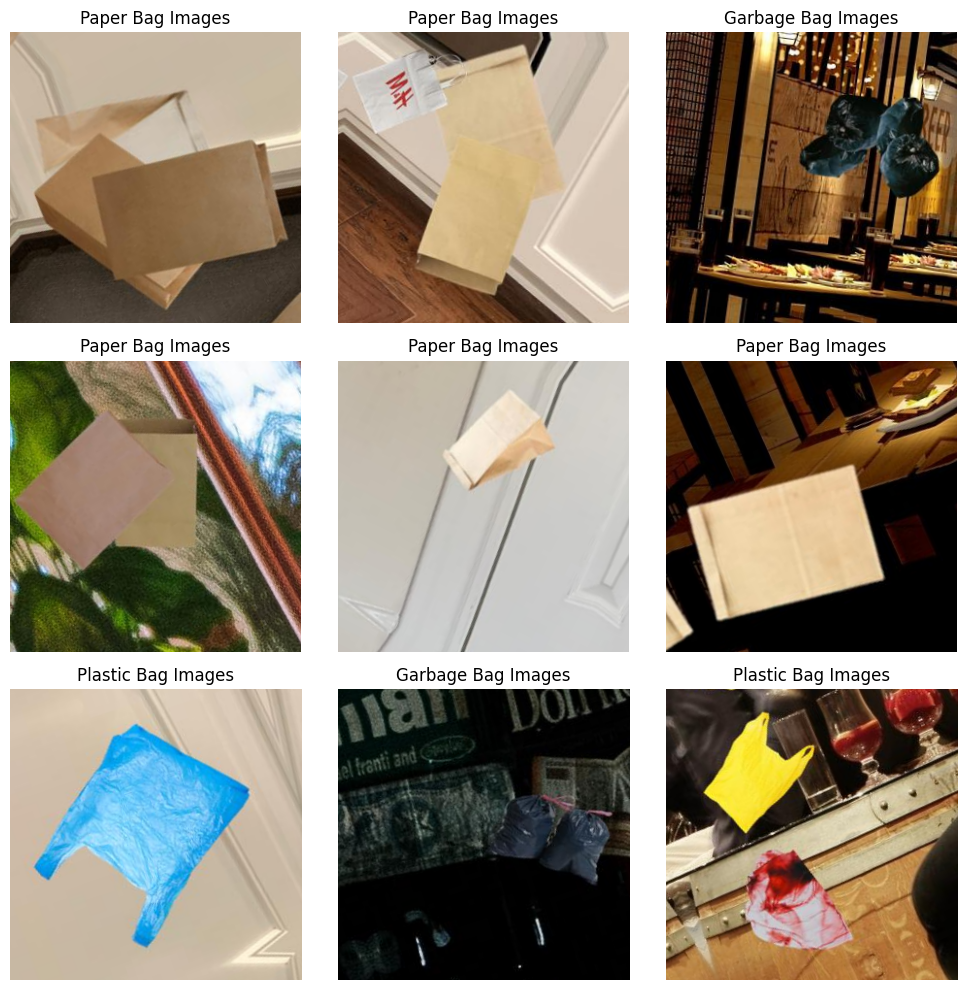

In [44]:
plt.figure(figsize=(10,10))
for i, (images, labels) in enumerate(train_generator):
    if i == 9:  # stop after 9 iterations
        break
    augmented_img = data_aug(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_img[0].numpy().astype("uint8"))
    class_index = np.argmax(labels[0])  # get the class index
    class_name = list(train_generator.class_indices.keys())[class_index]  # get the class name
    plt.title(class_name)  # display the class name
    plt.axis("off")
plt.tight_layout()
plt.show()

# 6. ANN Training (Sequential API)

## 6.1. Model Definition
> Bagian ini berisi cell untuk mendefinisikan model. Jelaskan alasan menggunakan suatu algoritma/model, hyperparameter yang dipakai, jenis penggunaan metrics yang dipakai, dan hal lain yang terkait dengan model.

In this notebook, we will create `Classification` model using `Artificial Neural Network` with `Sequential API` infrastructure.

Our model consist of several layers:
1. Input Layer: Which is the layer where we define our `input_shape` according to our processed data dimension.
2. Rescaling Layer: Which typically used at the beginning of a neural network to normalize the pixel values of input images and scale the pixel values to a specific range.
3. Convolutional Layer: Designed for feature extraction. In the context of image processing, these layers will detect patterns like edges, textures, and more complex structures.
4. Max Pooling Layer: Used to downsample the spatial dimensions of the image and reduce its complexity. It also retains the most important information while discarding less relevant details.
5. Fully connected layer (dense layer): Which is any layer between the input Layer and Output Layer.
6. Dropout Layer: Which is a layer placed between the Fully Connected Layer to help the model to avoid overfitting.
7. Output Layer: Which is the final layer where the output will be evaluate to see the model performance.

## 6.2. Model Training
> Cell pada bagian ini hanya berisi code untuk melatih model dan output yang dihasilkan. Lakukan beberapa kali proses training dengan hyperparameter yang berbeda untuk melihat hasil yang didapatkan. Analisis dan narasikan hasil ini pada bagian Model Evaluation.

In [45]:
# clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [46]:
model2 = Sequential([
  # Data augmentation and rescaling layers
  data_aug,
  layers.Rescaling(1./255),

  # Convolutional layer and max pooling layer
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(pool_size=(2, 2), padding="valid"),

  # fully connected layer
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dropout(0.2),
  layers.Dense(units=3,activation='softmax')
])

model2.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['accuracy'])

In [47]:
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 300, 300, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 300, 300, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 150, 150, 16)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 360000)            0         
                                                                 
 dense (Dense)               (None, 128)               46080128  
                                                        

In this sequential model there are several layers that we have define which includes:
- The `Rescaling` layer which helps to normalize the pixel values of the input images to the range [0, 1] and to speeding up the training process which allows the neural network to converge more quickly.

- The `Conv2D` layer using Kernel Size of `3` which is one of common convolutional filter and Padding `same` to help the model preserve the
imgae information.

- The activation layer uses `relu` because it is one of the most common activation function, it helps to scale the image between 0 and 1, and introduce non-linearity to the model so that it can learn more complex functions.

- The `MaxPooling2D` layer helps to reduce the dimensionality of the image by reducing the number of parameters and computation in the network so that the model can learn faster and focuses on the most important features.

- The `Flatten` layer used to convert the 2D feature maps to a 1D vector, preparing the data for the fully connected layers.

- The output layer (fully connected layer) with three output units, corresponding to the three classes (`plastic`, `paper`, `garbage`). In addition, `Softmax` activation is used to convert the raw output scores into probabilities, making it suitable for multi-class classification.

- The `Dropout` layer is added to prevent the model from overfitting.

In [48]:
epochs= 25
history_2= model2.fit(
    train_generator,
    validation_data= val_generator,
    epochs=epochs
)

Epoch 1/25
329/329 [==============================] - 46s 123ms/step - loss: 1.2332 - accuracy: 0.7515 - val_loss: 0.4338 - val_accuracy: 0.8230
Epoch 2/25
329/329 [==============================] - 40s 122ms/step - loss: 0.4355 - accuracy: 0.8318 - val_loss: 0.4054 - val_accuracy: 0.8460
Epoch 3/25
329/329 [==============================] - 41s 123ms/step - loss: 0.4043 - accuracy: 0.8429 - val_loss: 0.3639 - val_accuracy: 0.8577
Epoch 4/25
329/329 [==============================] - 40s 122ms/step - loss: 0.3843 - accuracy: 0.8517 - val_loss: 0.3849 - val_accuracy: 0.8600
Epoch 5/25
329/329 [==============================] - 40s 123ms/step - loss: 0.3712 - accuracy: 0.8582 - val_loss: 0.3692 - val_accuracy: 0.8607
Epoch 6/25
329/329 [==============================] - 40s 120ms/step - loss: 0.3662 - accuracy: 0.8589 - val_loss: 0.3577 - val_accuracy: 0.8650
Epoch 7/25
329/329 [==============================] - 39s 119ms/step - loss: 0.3560 - accuracy: 0.8582 - val_loss: 0.3481 - val_ac

## 6.3. Model Evaluation
> Pada bagian ini, dilakukan evaluasi model yang harus menunjukkan bagaimana performa model berdasarkan metrics yang dipilih. Hal ini harus dibuktikan dengan visualisasi tren performa dan/atau tingkat kesalahan model. **Lakukan analisis secara detail terkait dengan hasil pada model dan tuliskan hasil analisisnya**.

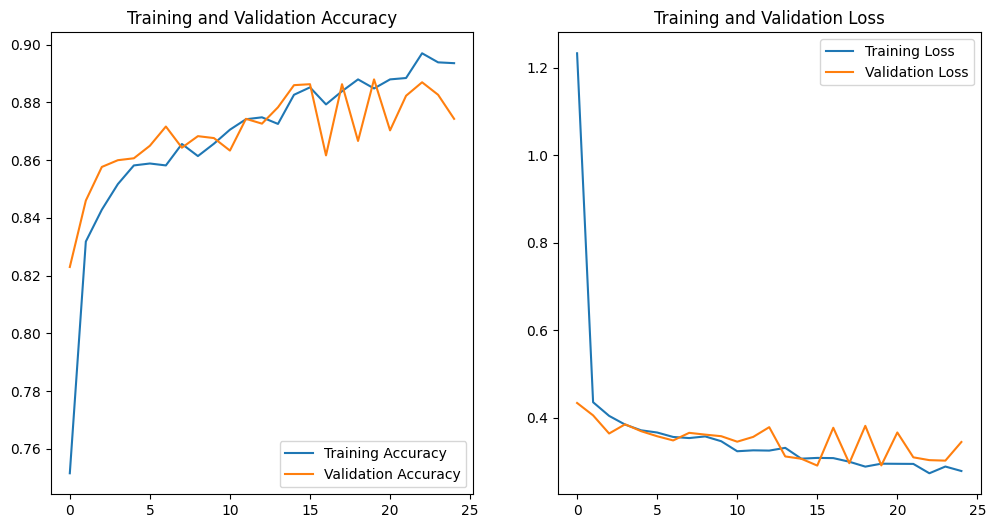

In [49]:
acc = history_2.history['accuracy']
val_acc = history_2.history['val_accuracy']

loss = history_2.history['loss']
val_loss = history_2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

- Based on the graph above, we can see the model achieveing a good performance in both training and validation set.
- This can be further analyzed based on the fact that the model not overfitting in both training and validation due to distance between the training and validation accuracy score.
- In addition to that, we can also see the Loss score of both training and validation set managed to achieve equilibrium by the fact that both score aren't too far apart and overlap with each other.

In [50]:
test_results_2 = model2.evaluate(test_generator, verbose=0)
print(f'Test Loss     : {test_results_2[0]:.4f}')
print(f'Test Accuracy : {test_results_2[1]:.4f}')

Test Loss     : 0.3568
Test Accuracy : 0.8747


In [51]:
test_predictions = model2.predict(test_generator)

47/47 [==============================] - 5s 96ms/step


In [52]:
# Convert predictions to class labels
predicted_classes = np.argmax(test_predictions, axis=1)

# Get class names
true_classes = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Find misclassified indices
misclassified_indices = np.where(predicted_classes != true_classes)[0]

class_report = classification_report(true_classes, predicted_classes, target_names=class_names)
print("\nClassification Report:")
print(class_report)


Classification Report:
                    precision    recall  f1-score   support

Garbage Bag Images       0.91      0.97      0.94       500
  Paper Bag Images       0.90      0.78      0.84       500
Plastic Bag Images       0.82      0.87      0.85       500

          accuracy                           0.87      1500
         macro avg       0.88      0.87      0.87      1500
      weighted avg       0.88      0.87      0.87      1500



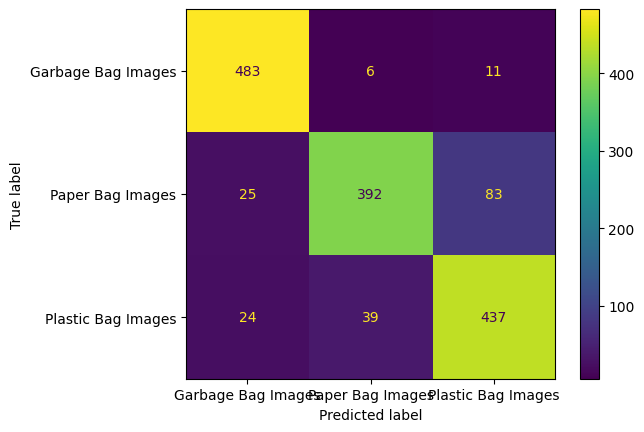

In [53]:
cm = confusion_matrix(true_classes, predicted_classes, labels=range(len(class_names)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot()
plt.show()

- Judging from the F1-score of the test set and also the confusion matrix, we can see the model perform best when predicting Garbage bag compared to the others.
- The model managed to achieve accuracy of `0.88` on test set which means the model can predict unseen data reasonably well.

# 7. ANN Improvement (Sequential API + Transfer Learning - ResNet50)


## 7.1. Model Definition
> Bagian ini berisi cell untuk mendefinisikan model. Jelaskan alasan menggunakan suatu algoritma/model, hyperparameter yang dipakai, jenis penggunaan metrics yang dipakai, dan hal lain yang terkait dengan model.


In this notebook, we will create `Classification` model using `Artificial Neural Network` with `Sequential API` infrastructure and transfer learning using `ResNet50` model.

Our model consist of several layers:
1. Input Layer: Which is the layer where we define our `input_shape`
2. Pre-Trained layer (ResNet50):
  - One of popular deep residual network that has shown remarkable performance in various computer vision tasks.
  - It introduce Residual Connections and Skip Connections.
  - Faster, needs less memory on GPU to train and nearly as accurate[ [source]](https://github.com/DeepLabCut/DeepLabCut/wiki/What-neural-network-should-I-use%3F-(Trade-offs,-speed-performance,-and-considerations))
2. Fully connected layer (dense layer): Which is any layer between the input Layer and Output Layer.
3. Dropout Layer: Which is a layer placed between the Fully Connected Layer to help the model to avoid overfitting.
4. Output Layer: Which is the final layer where the output will be evaluate to see the model performance.


## 7.2. Model Training
> Cell pada bagian ini hanya berisi code untuk melatih model dan output yang dihasilkan. Lakukan beberapa kali proses training dengan hyperparameter yang berbeda untuk melihat hasil yang didapatkan. Analisis dan narasikan hasil ini pada bagian Model Evaluation.

In [54]:
# clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [55]:
inputs= (img_height, img_width,3)

pretrained_model = tf.keras.applications.ResNet50(include_top=False,
                                                  input_shape=inputs,
                                                  pooling='avg')
pretrained_model.trainable = False

94765736/94765736 [==============================] - 1s 0us/step


To set up our ResNet50 Pre Trained Models, some of the hyperparameter has ben set up:

- `tf.keras.applications.ResNet50(include_top=False, input_shape=inputs, pooling='avg')`: This line imports the ResNet50 model without the top (fully connected) layers since it will allow us to input `300x300` sized imaged which differs to the images used for the ResNet50 model training `224x224`. The global average pooling also set to `avg` to reduce spatial dimensions. The pre-trained ResNet50 model has already learned useful hierarchical features from a large dataset.

- `pretrained_model.trainable = False`: This line freezes the weights of the pre-trained layers, preventing them from being updated during training. This is a common practice in transfer learning to retain the knowledge learned by the pre-trained model and avoid overfitting on a smaller dataset.

In [56]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience= 3, restore_best_weights=True)
]

- The `EarlyStopping` callback is included to monitor the validation loss during training. If the validation loss does not improve for a certain number of consecutive epochs (patience=3), training will stop, and the weights from the epoch with the best validation loss will be restored (`restore_best_weights=True`). This created to prevent overfitting and saves the best model.

In [57]:
model_tf= Sequential()
model_tf.add(pretrained_model)

#fully connected layer
model_tf.add(Flatten(trainable=False))
model_tf.add(Dense(128, activation='relu')),
model_tf.add(Dropout(0.2)),
model_tf.add(Dense(units=3,activation='softmax'))


In [58]:
model_tf.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['accuracy'])

In [59]:
model_tf.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 3)                 387       
                                                                 
Total params: 23850371 (90.98 MB)
Trainable params: 262659 (1.00 MB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In this sequential model there are several layers that we have define which includes:
- The `Flatten()` layer used to convert the 3D feature maps to a 1D vector. The `trainable=False` parameter ensures that this layer remains non-trainable.

- The fully connected layer `Dense(128, activation='relu')`, which we get from the previous model since we can get a good result and trying to improve the model using transfer learning.

- The `Dense(units=3, activation='softmax')` layer which is the output layer with 3 units (corresponding to the three classes) and softmax activation for multi-class classification.

- The `Dropout` layer is added to prevent the model from overfitting.

In [60]:
epochs= 25
history_3= model_tf.fit(
    train_generator,
    validation_data= val_generator,
    callbacks=callbacks,
    epochs=epochs
)

Epoch 1/25
329/329 [==============================] - 94s 264ms/step - loss: 0.1475 - accuracy: 0.9459 - val_loss: 0.0684 - val_accuracy: 0.9743
Epoch 2/25
329/329 [==============================] - 81s 247ms/step - loss: 0.0516 - accuracy: 0.9808 - val_loss: 0.0482 - val_accuracy: 0.9803
Epoch 3/25
329/329 [==============================] - 81s 247ms/step - loss: 0.0406 - accuracy: 0.9840 - val_loss: 0.0575 - val_accuracy: 0.9763
Epoch 4/25
329/329 [==============================] - 81s 247ms/step - loss: 0.0317 - accuracy: 0.9891 - val_loss: 0.0568 - val_accuracy: 0.9780
Epoch 5/25
329/329 [==============================] - 81s 247ms/step - loss: 0.0222 - accuracy: 0.9916 - val_loss: 0.0423 - val_accuracy: 0.9850
Epoch 6/25
329/329 [==============================] - 81s 247ms/step - loss: 0.0199 - accuracy: 0.9929 - val_loss: 0.0371 - val_accuracy: 0.9847
Epoch 7/25
329/329 [==============================] - 81s 247ms/step - loss: 0.0154 - accuracy: 0.9946 - val_loss: 0.0384 - val_ac

## 7.3. Model Evaluation
> Pada bagian ini, dilakukan evaluasi model yang harus menunjukkan bagaimana performa model berdasarkan metrics yang dipilih. Hal ini harus dibuktikan dengan visualisasi tren performa dan/atau tingkat kesalahan model. **Lakukan analisis secara detail terkait dengan hasil pada model dan tuliskan hasil analisisnya**.

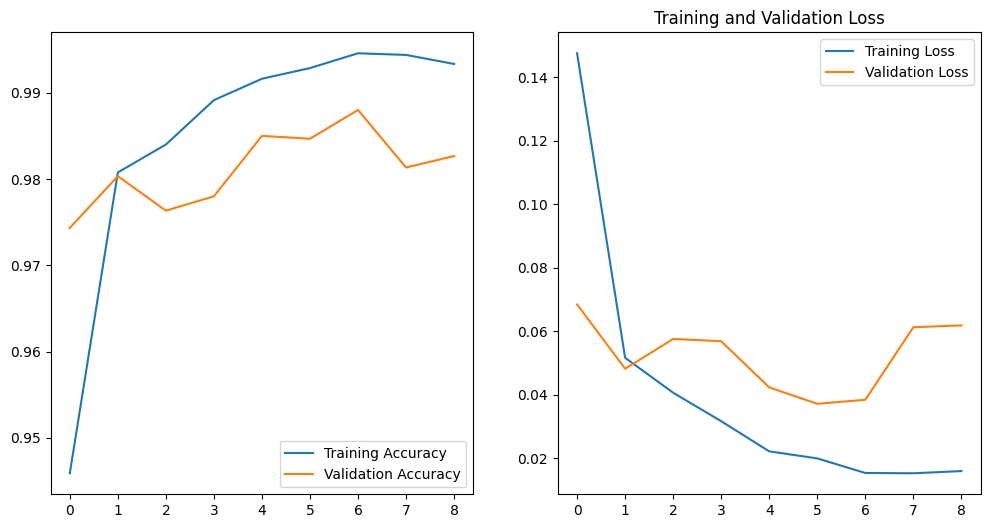

In [61]:
acc = history_3.history['accuracy']
val_acc = history_3.history['val_accuracy']

loss = history_3.history['loss']
val_loss = history_3.history['val_loss']

# Get the length of the accuracy history
num_epochs = len(acc)

# Create a range object for the number of epochs
epochs_range = range(num_epochs)

# Plot the training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.show()

- From the graph above, we can see the model perform execptionaly well in both training and validation set which managed to reach accuracy between `0.94` to `0.99`
- The distance between both the accuracy and validation score of both training and validation set aren't too far aparty which signifies good fit of the model.

In [62]:
test_results_3 = model_tf.evaluate(test_generator, verbose=0)
print(f'Test Loss     : {test_results_3[0]:.4f}')
print(f'Test Accuracy : {test_results_3[1]:.4f}')

Test Loss     : 0.0336
Test Accuracy : 0.9867


In [63]:
test_predictions = model_tf.predict(test_generator)

47/47 [==============================] - 10s 189ms/step


In [64]:
# Convert predictions to class labels
predicted_classes = np.argmax(test_predictions, axis=1)

# Get true class labels from the test generator
true_classes = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Find misclassified indices
misclassified_indices = np.where(predicted_classes != true_classes)[0]

class_report = classification_report(true_classes, predicted_classes, target_names=class_names)
print("\nClassification Report:")
print(class_report)


Classification Report:
                    precision    recall  f1-score   support

Garbage Bag Images       1.00      0.99      0.99       500
  Paper Bag Images       0.98      0.99      0.99       500
Plastic Bag Images       0.98      0.98      0.98       500

          accuracy                           0.99      1500
         macro avg       0.99      0.99      0.99      1500
      weighted avg       0.99      0.99      0.99      1500



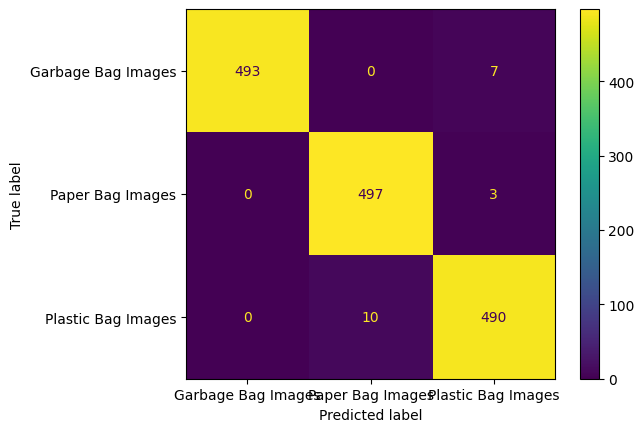

In [65]:
cm = confusion_matrix(true_classes, predicted_classes, labels=range(len(class_names)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot()
plt.show()

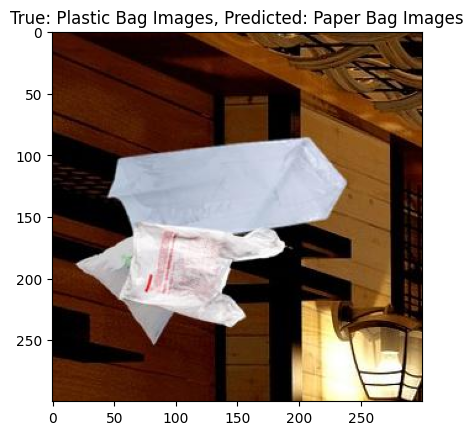

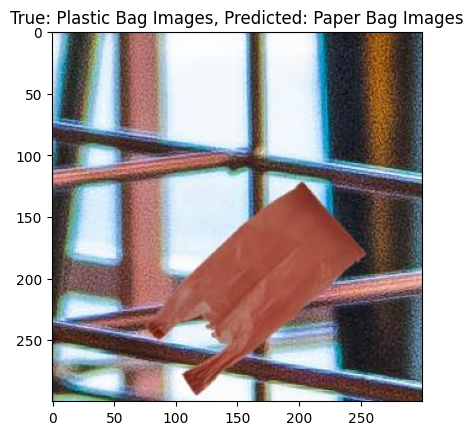

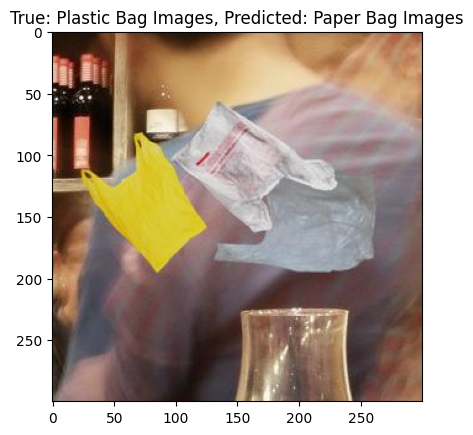

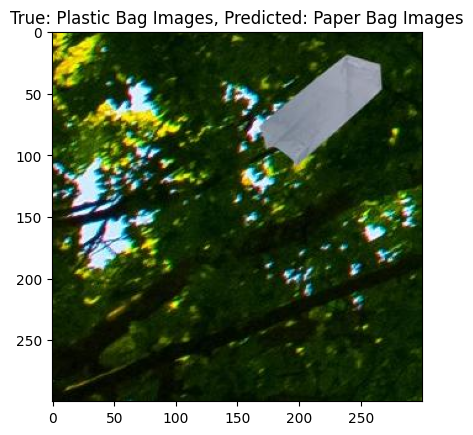

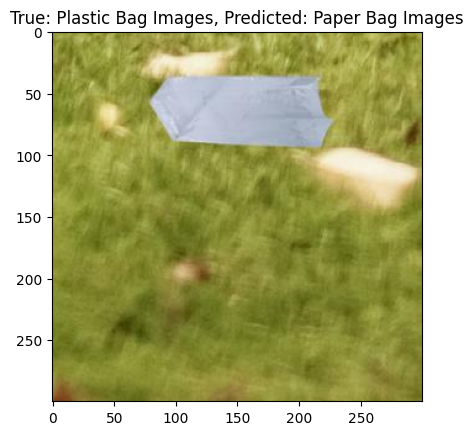

...

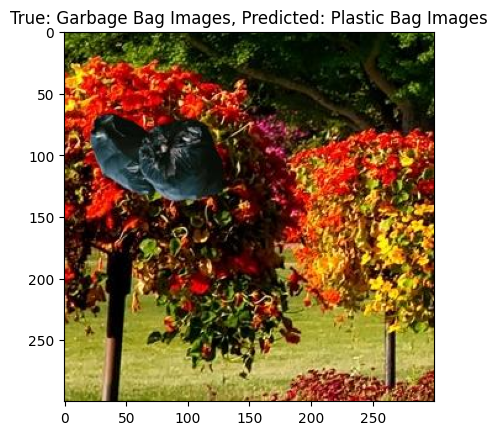

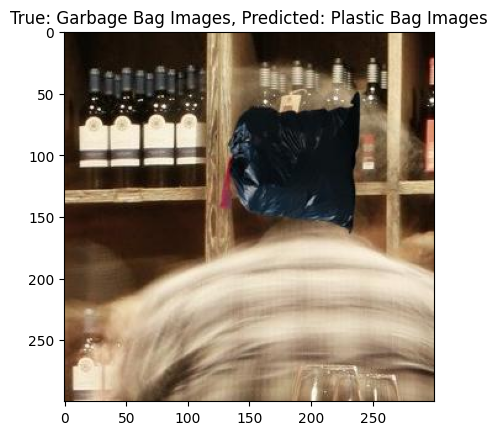

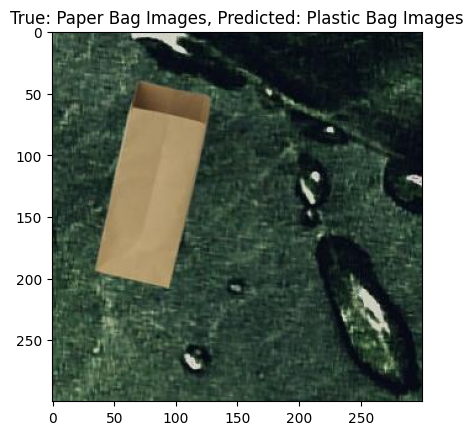

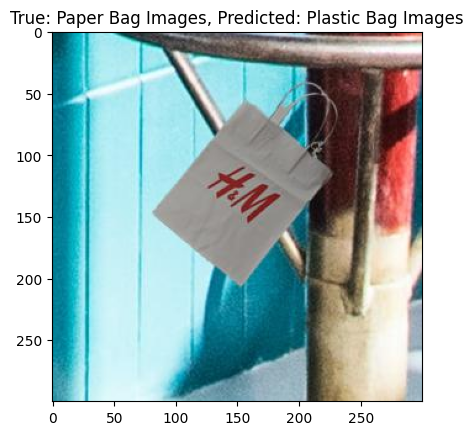

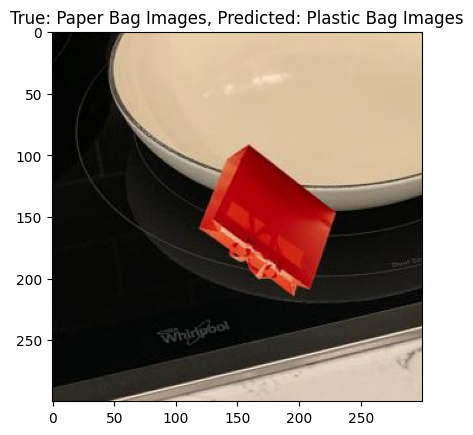

In [66]:
# Print misclassified images
for index in misclassified_indices:
    img_path = test_generator.filepaths[index]
    true_class = class_names[true_classes[index]]
    predicted_class = class_names[predicted_classes[index]]

    # Display the image with true and predicted labels
    plt.title(f'True: {true_class}, Predicted: {predicted_class}')
    plt.imshow(plt.imread(img_path))
    plt.show()

- Judging from the F1-score of the test set and also the confusion matrix, we can see the model perform extremely well proven by the fact it can achieve accuracy score of `0.98 - 0.99` .
- Comparing some of the mistakes that the model make, we can see several pattern happend:
  - The model failed to correctly predict some item as plastic bag due to some of the plastic bag shape is rectangular and very similar to paper bag. As we have defined previously that our most of our plastic bag data have handle at the end which differential it with paper bag.
  - On some of image where the background is dominated with color brown similar to our paper bag dataset, the model also failed to again detect plastic bag correctly.
  - Black plastic bag also sometimes mistakenly detected as garbage bag potentially due the fact that most of our garbage bag image characteristics defined as having black colored object.

# 8. Model Saving
> Pada bagian ini, dilakukan proses penyimpanan model dan file-file lain yang terkait dengan hasil proses pembuatan model. Pilihlah 1 arsitektur ANN yang terbaik berdasarkan hasil evaluasi sebelumnya. **Nyatakan secara jelas arsitektur mana yang akan dipakai sebagai model terbaik (Sequential API atau Functional API).**

In [67]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [68]:
# Explicitly define the order of classes
desired_class_order = ['Garbage Bag Images', 'Paper Bag Images', 'Plastic Bag Images']

# Get unique true class names and their indices
unique_true_classes_indices = np.unique(true_classes)
unique_true_classes = [class_names[idx] for idx in unique_true_classes_indices]

# Sort the classes based on the desired order
sorted_unique_true_classes = sorted(unique_true_classes, key=lambda x: desired_class_order.index(x))

# Save the unique full class names to a file
with open('/content/drive/MyDrive/Colab Notebooks/P2G7_gilbert_kurniawan_model/classes.txt', 'w') as file:
    for true_class in sorted_unique_true_classes:
        file.write(f"{true_class}\n")

In [69]:
# model summary
model_tf.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 3)                 387       
                                                                 
Total params: 23850371 (90.98 MB)
Trainable params: 262659 (1.00 MB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [70]:
# freeze model
model_tf.trainable = False
model_tf.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 3)                 387       
                                                                 
Total params: 23850371 (90.98 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 23850371 (90.98 MB)
_________________________________________________________________


In [71]:
# save ANN model
model_tf.save('/content/drive/MyDrive/Colab Notebooks/P2G7_gilbert_kurniawan_model/model_tf_fix.h5')

In [72]:
# model summary
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 300, 300, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 300, 300, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 150, 150, 16)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 360000)            0         
                                                                 
 dense (Dense)               (None, 128)               46080128  
                                                        

In [73]:
# freeze model
model2.trainable = False
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 300, 300, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 300, 300, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 150, 150, 16)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 360000)            0         
                                                                 
 dense (Dense)               (None, 128)               46080128  
                                                        

In [74]:
# save ANN model
model2.save('/content/drive/MyDrive/Colab Notebooks/P2G7_gilbert_kurniawan_model/model_seq.h5')

### Conclusion
- For our model inference, we will be using Sequential model with Transfer Learning (ResNet50) due to the fact that it perform far better in term of accuracy score than the normal Sequential model and also the model size is far more smaller (90 MB vs 500 MB).

# 9. Pengambilan Kesimpulan
> Pada bagian terakhir ini, **harus berisi** kesimpulan yang mencerminkan hasil yang didapat dengan *objective* yang sudah ditulis di bagian pengenalan.

## Conclusion & Future Work Suggestion

---

- In this notebook, we have managed to create 2 Artificial Neural Network model using Sequential API and Transfer Learning using ResNet50 .
---

- Sequential API model perform well proven by the both constant decresase in train and valiadation loss score and constant increase in accuracy score.
- Sequential API model also managed to reach Good Fit proven by the loss and accuracy score of the training and validation proven by the graph managed to reach equilibrium point.
- Further improvement for the Sequential API model can be in form of higher number of epoch training time since the model still climbing and it may be worth to check if the model can reach higher accuracy.

---

- For the transfer learning model, the model itself also perform really well in term of the train and validation accuracy and loss score.
- This can be seen from the very high score of accuracy from both training and validation and also very little loss score and distance between the training and validation set.

---

- The strength of the models is that it perform execptionally well to classify whether the item presented is either a paper, plastic, or garbage bag.
- The weakness of the models is the models struggle to predict items in these certain condition:
  - This model is heavily influenced by the shape and color of the item. In case the plastic is recatangularly shape and colored similar to paper bag (brown-ish) there is high possibility that the model may misclassified the item.
  - This also applied to plastic with black color. The model tend to analyze the black plastic to garbage bag.
  - This model may also potentially influenced by the color of the background image. If the brown-ish or black color dominate the image, there is possibility that the model will classify the item as paper bag or garbage bag.
  - In case there is multiple bag with different classes, the model will tend to classify it as the majority class in the image.

- Suggestion for development/usage in the future
  - To try to create multi-label classification instead since there is possibility of multiple trash in an image based on real world scenario.
  - If possible, find and use RGB-D (Red, Green, Blue, Depth) or RGNIR (Red, Green, Near-Infrared) image dataset which has been proven more accurate than RGB image in solid waste sorting ([Yu, Yan & Zou, Siyu & Yin, Kejie. (2020)](https://www.researchgate.net/publication/344708656_A_novel_detection_fusion_network_for_solid_waste_sorting)); ([O. Tamin, E. G. Moung, J. A. Dargham, F. Yahya, S. Omatu and L. Angeline. (2022)](
  https://www.mdpi.com/2504-2289/7/2/103)) due to the fact it also saved the depth value of the image which help the model to learn additional features.